# Need for Speed: Alternatives to our beloved Pandas

## 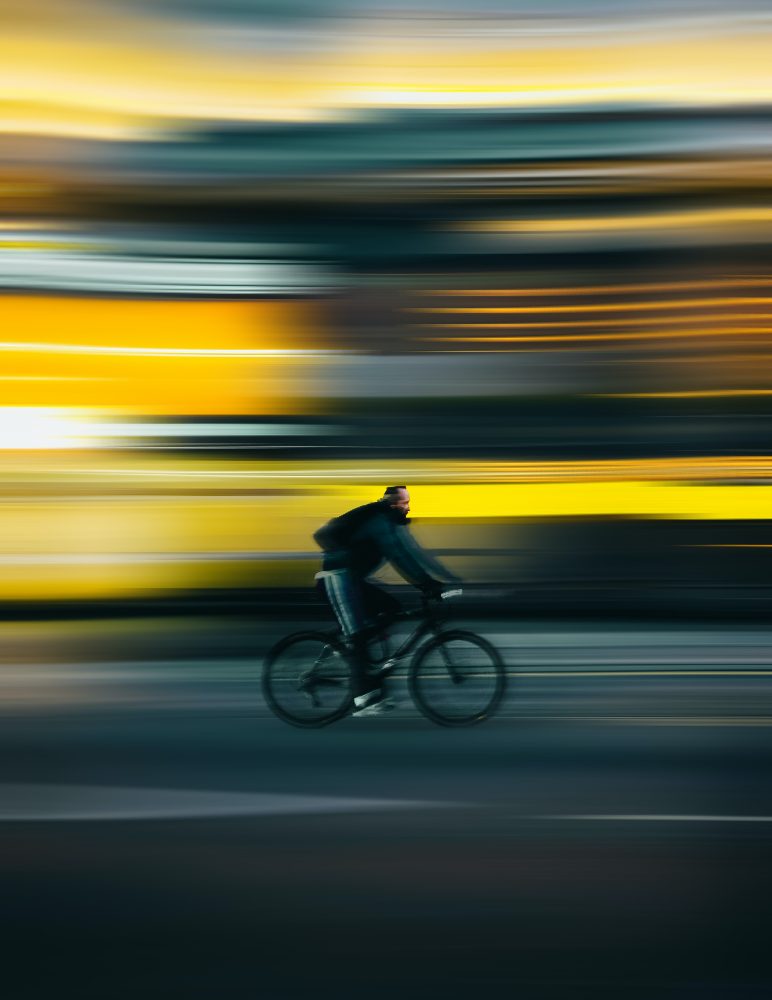

In the last article we studied that 
* Polars does provide a drammatic improvement in the time cosumed to conduct a task of reading the data into Polars dataframe. 
* Polars allows lazy operations hence the code is not executed until it is explicitly asked to be executed

In today's experiment we are going to quickly check the impact of polars objects in terms of memory consumed. At the end of the article we will conclude what method of Polars dataframes consume the least amount of memory and are still functionally better or equivalent to the defaults. 

So, Let's get stated ! 

***

Our setup remains same as before 

In [2]:
! uname -a

Linux m-mega 5.15.0-46-generic #49~20.04.1-Ubuntu SMP Thu Aug 4 19:15:44 UTC 2022 x86_64 x86_64 x86_64 GNU/Linux


In [3]:
! python --version

Python 3.10.4


In [4]:
import polars as pl
import pandas as pd
import os


## Getting the data

As always we start with reading the NY taxi data for Jan 2021 using Pandas. First we download data from amazon S3 link to a local storage. 

for y in [2019,2020,2021,2022]:
    for i in range(1,12):
        url = f"https://d37ci6vzurychx.cloudfront.net/trip-data/fhvhv_tripdata_{str(y)}-{str(i).zfill(2)}.parquet"
        ! wget -N $url > null


!mv *.parquet ./data/.

In [5]:
for root, dir, files in os.walk("./data/"):
    parquets = [os.path.join(root, file) for file in files]


In [7]:
from pyarrow.parquet import ParquetDataset
files = list(filter(lambda f: f.endswith('.parquet'), parquets))
files.sort()
for i in files:
    nrows = 0
    dataset = ParquetDataset(i, use_legacy_dataset=False)
    for piece in dataset.fragments:
        nrows += piece.count_rows()
    print(i,nrows)


./data/fhvhv_tripdata_2019-02.parquet 20159102
./data/fhvhv_tripdata_2019-03.parquet 23864598
./data/fhvhv_tripdata_2019-04.parquet 21734822
./data/fhvhv_tripdata_2019-05.parquet 22329247
./data/fhvhv_tripdata_2019-06.parquet 21001990
./data/fhvhv_tripdata_2019-07.parquet 20303312
./data/fhvhv_tripdata_2019-08.parquet 20126113
./data/fhvhv_tripdata_2019-09.parquet 20069321
./data/fhvhv_tripdata_2019-10.parquet 21162290
./data/fhvhv_tripdata_2019-11.parquet 21635568
./data/fhvhv_tripdata_2020-01.parquet 20569368
./data/fhvhv_tripdata_2020-02.parquet 21725100
./data/fhvhv_tripdata_2020-03.parquet 13392928
./data/fhvhv_tripdata_2020-04.parquet 4312909
./data/fhvhv_tripdata_2020-05.parquet 6089999
./data/fhvhv_tripdata_2020-06.parquet 7555193
./data/fhvhv_tripdata_2020-07.parquet 9958454
./data/fhvhv_tripdata_2020-08.parquet 11096852
./data/fhvhv_tripdata_2020-09.parquet 12106669
./data/fhvhv_tripdata_2020-10.parquet 13268411
./data/fhvhv_tripdata_2020-11.parquet 11596865
./data/fhvhv_trip

In [8]:
def sample_parquet(file, nrows):
    from pyarrow.parquet import ParquetFile
    import pyarrow as pa 
    pf = ParquetFile(file) 
    batch = next(pf.iter_batches(batch_size = nrows)) 
    return pa.Table.from_batches([batch])


base = str(sample_parquet(files[0],5).to_pandas().columns)
print(base)
for i in files:
    if base == str(sample_parquet(i,5).to_pandas().columns):
        print(f"same schema {i}")
    else:
        print(f"schema changed \n {str(sample_parquet(i,5).to_pandas().dtypes)}")

Index(['hvfhs_license_num', 'dispatching_base_num', 'originating_base_num',
       'request_datetime', 'on_scene_datetime', 'pickup_datetime',
       'dropoff_datetime', 'PULocationID', 'DOLocationID', 'trip_miles',
       'trip_time', 'base_passenger_fare', 'tolls', 'bcf', 'sales_tax',
       'congestion_surcharge', 'airport_fee', 'tips', 'driver_pay',
       'shared_request_flag', 'shared_match_flag', 'access_a_ride_flag',
       'wav_request_flag', 'wav_match_flag'],
      dtype='object')
same schema ./data/fhvhv_tripdata_2019-02.parquet
same schema ./data/fhvhv_tripdata_2019-03.parquet
same schema ./data/fhvhv_tripdata_2019-04.parquet
same schema ./data/fhvhv_tripdata_2019-05.parquet
same schema ./data/fhvhv_tripdata_2019-06.parquet
same schema ./data/fhvhv_tripdata_2019-07.parquet
same schema ./data/fhvhv_tripdata_2019-08.parquet
same schema ./data/fhvhv_tripdata_2019-09.parquet
same schema ./data/fhvhv_tripdata_2019-10.parquet
same schema ./data/fhvhv_tripdata_2019-11.parquet
sam

In [9]:
import pyarrow as pa 
import pyarrow.parquet as pq
pq.read_metadata(files[0]).schema

required group field_id=-1 schema {
  optional binary field_id=-1 hvfhs_license_num (String);
  optional binary field_id=-1 dispatching_base_num (String);
  optional binary field_id=-1 originating_base_num (String);
  optional int64 field_id=-1 request_datetime (Timestamp(isAdjustedToUTC=false, timeUnit=microseconds, is_from_converted_type=false, force_set_converted_type=false));
  optional int64 field_id=-1 on_scene_datetime (Timestamp(isAdjustedToUTC=false, timeUnit=microseconds, is_from_converted_type=false, force_set_converted_type=false));
  optional int64 field_id=-1 pickup_datetime (Timestamp(isAdjustedToUTC=false, timeUnit=microseconds, is_from_converted_type=false, force_set_converted_type=false));
  optional int64 field_id=-1 dropoff_datetime (Timestamp(isAdjustedToUTC=false, timeUnit=microseconds, is_from_converted_type=false, force_set_converted_type=false));
  optional int64 field_id=-1 PULocationID;
  optional int64 field_id=-1 DOLocationID;
  optional double field_id=-1 

In [10]:
data = pd.concat([pd.read_parquet(i) for i in files[0:2]])

In [11]:
print(data.info(memory_usage='deep'))
print(data.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44023700 entries, 0 to 23864597
Data columns (total 24 columns):
 #   Column                Dtype         
---  ------                -----         
 0   hvfhs_license_num     object        
 1   dispatching_base_num  object        
 2   originating_base_num  object        
 3   request_datetime      datetime64[ns]
 4   on_scene_datetime     datetime64[ns]
 5   pickup_datetime       datetime64[ns]
 6   dropoff_datetime      datetime64[ns]
 7   PULocationID          int64         
 8   DOLocationID          int64         
 9   trip_miles            float64       
 10  trip_time             int64         
 11  base_passenger_fare   float64       
 12  tolls                 float64       
 13  bcf                   float64       
 14  sales_tax             float64       
 15  congestion_surcharge  float64       
 16  airport_fee           object        
 17  tips                  float64       
 18  driver_pay            float64       
 19

In [8]:
data1 = data.convert_dtypes()
print(data1.info(memory_usage='deep'))
print(data1.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 212386363 entries, 0 to 21635567
Data columns (total 24 columns):
 #   Column                Dtype         
---  ------                -----         
 0   hvfhs_license_num     string        
 1   dispatching_base_num  string        
 2   originating_base_num  string        
 3   request_datetime      datetime64[ns]
 4   on_scene_datetime     datetime64[ns]
 5   pickup_datetime       datetime64[ns]
 6   dropoff_datetime      datetime64[ns]
 7   PULocationID          Int64         
 8   DOLocationID          Int64         
 9   trip_miles            Float64       
 10  trip_time             Int64         
 11  base_passenger_fare   Float64       
 12  tolls                 Float64       
 13  bcf                   Float64       
 14  sales_tax             Float64       
 15  congestion_surcharge  Float64       
 16  airport_fee           Int64         
 17  tips                  Float64       
 18  driver_pay            Float64       
 1

In [19]:
data.shape

(212386363, 24)

In [12]:
sample = data.sample(100000)

In [13]:
info = pd.DataFrame(pd.DataFrame([sample.columns, sample.nunique(),sample.dtypes]).T)
info.columns = ['names','uniques','types']
info

,names,uniques,types
0,hvfhs_license_num,4,object
1,dispatching_base_num,34,object
2,originating_base_num,33,object
3,request_datetime,98615,datetime64[ns]
4,on_scene_datetime,69223,datetime64[ns]
5,pickup_datetime,98861,datetime64[ns]
6,dropoff_datetime,98803,datetime64[ns]
7,PULocationID,258,int64
8,DOLocationID,258,int64
9,trip_miles,3171,float64


In [14]:
import numpy as np
x = info.names.where((info.types=='object') & (info.uniques < 40))
categorical_of_interest = x[~pd.isnull(x)].to_list()
categorical_of_interest


['hvfhs_license_num',
 'dispatching_base_num',
 'originating_base_num',
 'airport_fee',
 'shared_request_flag',
 'shared_match_flag',
 'access_a_ride_flag',
 'wav_request_flag',
 'wav_match_flag']

In [32]:
# Columns to be converted to categorical 
sample2 = sample.copy(deep=True)
for i in categorical_of_interest:
    sample2[i] = pd.Categorical(sample2[i])

In [33]:
import numbers
import pandas as pd
from typing import Optional

def auto_opt_pd_dtypes(df_: pd.DataFrame, inplace=False) -> Optional[pd.DataFrame]:
    """ Automatically downcast Number dtypes for minimal possible,
        will not touch other (datetime, str, object, etc)
        
        :param df_: dataframe
        :param inplace: if False, will return a copy of input dataset
        
        :return: `None` if `inplace=True` or dataframe if `inplace=False`
    """
    df = df_ if inplace else df_.copy()
        
    for col in df.columns:
        # integers
        if issubclass(df[col].dtypes.type, numbers.Integral):
            # unsigned integers
            if df[col].min() >= 0:
                df[col] = pd.to_numeric(df[col], downcast='unsigned')
            # signed integers
            else:
                df[col] = pd.to_numeric(df[col], downcast='integer')
        # other real numbers
        elif issubclass(df[col].dtypes.type, numbers.Real):
            df[col] = pd.to_numeric(df[col], downcast='float')
    
    if not inplace:
        return df
    

sample3 = auto_opt_pd_dtypes(sample2)

In [36]:
def memory_usage(data):
    deep = round(pd.DataFrame(data.memory_usage(deep=True, index=True),columns=['deep'])/1024, 2)
    shallow = round(pd.DataFrame(data.memory_usage(deep=False, index=True),columns=['shallow'])/1024, 2)
    dtypes = pd.DataFrame(data.dtypes, columns=['dytypes']) 
    out = pd.concat([deep,shallow,dtypes], axis = 1)
    out['pct_diff'] = round((out.deep - out.shallow)/100,2)
    return out


In [39]:
print(memory_usage(sample), '\n')
print(memory_usage(sample2), '\n')
print(memory_usage(sample3), '\n')

                         deep  shallow         dytypes  pct_diff
Index                  781.25   781.25             NaN      0.00
hvfhs_license_num     6152.34   781.25          object     53.71
dispatching_base_num  6152.27   781.25          object     53.71
originating_base_num  5159.37   781.25          object     43.78
request_datetime       781.25   781.25  datetime64[ns]      0.00
on_scene_datetime      781.25   781.25  datetime64[ns]      0.00
pickup_datetime        781.25   781.25  datetime64[ns]      0.00
dropoff_datetime       781.25   781.25  datetime64[ns]      0.00
PULocationID           781.25   781.25           int64      0.00
DOLocationID           781.25   781.25           int64      0.00
trip_miles             781.25   781.25         float64      0.00
trip_time              781.25   781.25           int64      0.00
base_passenger_fare    781.25   781.25         float64      0.00
tolls                  781.25   781.25         float64      0.00
bcf                    78

In [103]:


print(sample.memory_usage(deep=True, index=True))
print(sample.memory_usage(deep=False, index=True))

print(sample2.memory_usage(deep=True, index=True))
print(sample2.memory_usage(deep=False, index=True))

print(sample3.memory_usage(deep=True, index=True))
print(sample3.memory_usage(deep=False, index=True))


,deep,shallow
Index,800000,800000
hvfhs_license_num,6300000,800000
dispatching_base_num,6299961,800000
originating_base_num,5255922,800000
request_datetime,800000,800000
on_scene_datetime,800000,800000
pickup_datetime,800000,800000
dropoff_datetime,800000,800000
PULocationID,800000,800000
DOLocationID,800000,800000


In [17]:
from pandas_profiling import ProfileReport
ProfileReport(sample)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

,names,uniques,types
0,hvfhs_license_num,4,object
1,dispatching_base_num,33,object
2,originating_base_num,31,object
3,request_datetime,999,datetime64[ns]
4,on_scene_datetime,710,datetime64[ns]
5,pickup_datetime,1000,datetime64[ns]
6,dropoff_datetime,1000,datetime64[ns]
7,PULocationID,201,int64
8,DOLocationID,204,int64
9,trip_miles,672,float64


In [12]:
def reduce_mem_usage(props):
    import pandas as pd 
    import numpy as np
    start_mem_usg = props.memory_usage().sum() / 1024**2 
    print("Memory usage of properties dataframe is :",start_mem_usg," MB")
    NAlist = [] # Keeps track of columns that have missing values filled in. 
    for col in props.columns:
        if props[col].dtype != object:  # Exclude strings
            
            # Print current column type
            print("******************************")
            print("Column: ",col)
            print("dtype before: ",props[col].dtype)
            
            # make variables for Int, max and min
            IsInt = False
            mx = props[col].max()
            mn = props[col].min()
            
            # Integer does not support NA, therefore, NA needs to be filled
            if not np.isfinite(props[col]).all(): 
                NAlist.append(col)
                props[col].fillna(mn-1,inplace=True)  
                   
            # test if column can be converted to an integer
            asint = props[col].fillna(0).astype(np.int64)
            result = (props[col] - asint)
            result = result.sum()
            if result > -0.01 and result < 0.01:
                IsInt = True

            
            # Make Integer/unsigned Integer datatypes
            if IsInt:
                if mn >= 0:
                    if mx < 255:
                        props[col] = props[col].astype(np.uint8)
                    elif mx < 65535:
                        props[col] = props[col].astype(np.uint16)
                    elif mx < 4294967295:
                        props[col] = props[col].astype(np.uint32)
                    else:
                        props[col] = props[col].astype(np.uint64)
                else:
                    if mn > np.iinfo(np.int8).min and mx < np.iinfo(np.int8).max:
                        props[col] = props[col].astype(np.int8)
                    elif mn > np.iinfo(np.int16).min and mx < np.iinfo(np.int16).max:
                        props[col] = props[col].astype(np.int16)
                    elif mn > np.iinfo(np.int32).min and mx < np.iinfo(np.int32).max:
                        props[col] = props[col].astype(np.int32)
                    elif mn > np.iinfo(np.int64).min and mx < np.iinfo(np.int64).max:
                        props[col] = props[col].astype(np.int64)    
            
            # Make float datatypes 32 bit
            else:
                props[col] = props[col].astype(np.float32)
            
            # Print new column type
            print("dtype after: ",props[col].dtype)
            print("******************************")
    
    # Print final result
    print("___MEMORY USAGE AFTER COMPLETION:___")
    mem_usg = props.memory_usage().sum() / 1024**2 
    print("Memory usage is: ",mem_usg," MB")
    print("This is ",100*mem_usg/start_mem_usg,"% of the initial size")
    return props, NAlist

In [14]:
import pandas as pd 
pd.read_parquet(files[0]).head()

,hvfhs_license_num,dispatching_base_num,originating_base_num,request_datetime,on_scene_datetime,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,trip_miles,...,sales_tax,congestion_surcharge,airport_fee,tips,driver_pay,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
0,HV0003,B02867,B02867,2019-02-01 00:01:26,2019-02-01 00:02:55,2019-02-01 00:05:18,2019-02-01 00:14:57,245,251,2.45,...,0.83,0.0,None,0.0,7.48,Y,N,N,N,None
1,HV0003,B02879,B02879,2019-02-01 00:26:08,2019-02-01 00:41:29,2019-02-01 00:41:29,2019-02-01 00:49:39,216,197,1.71,...,0.70,0.0,None,2.0,7.93,N,N,N,N,None
2,HV0005,B02510,None,2019-02-01 00:48:58,NaT,2019-02-01 00:51:34,2019-02-01 01:28:29,261,234,5.01,...,3.99,0.0,None,0.0,35.97,N,Y,N,N,None
3,HV0005,B02510,None,2019-02-01 00:02:15,NaT,2019-02-01 00:03:51,2019-02-01 00:07:16,87,87,0.34,...,0.64,0.0,None,3.0,5.39,N,Y,N,N,None
4,HV0005,B02510,None,2019-02-01 00:06:17,NaT,2019-02-01 00:09:44,2019-02-01 00:39:56,87,198,6.84,...,2.16,0.0,None,4.0,17.07,N,Y,N,N,None


In [113]:


base = str(sample_parquet(files[0],5).to_pandas().dtypes)
print(base)
for i in files:
    if base == str(sample_parquet(i,5).to_pandas().dtypes):
        print(f"same schema {i}")
    else:
        print(f"schema changed \n {str(sample_parquet(i,5).to_pandas().dtypes)}")

hvfhs_license_num               object
dispatching_base_num            object
originating_base_num            object
request_datetime        datetime64[ns]
on_scene_datetime       datetime64[ns]
pickup_datetime         datetime64[ns]
dropoff_datetime        datetime64[ns]
PULocationID                     int64
DOLocationID                     int64
trip_miles                     float64
trip_time                        int64
base_passenger_fare            float64
tolls                          float64
bcf                            float64
sales_tax                      float64
congestion_surcharge           float64
airport_fee                     object
tips                           float64
driver_pay                     float64
shared_request_flag             object
shared_match_flag               object
access_a_ride_flag              object
wav_request_flag                object
wav_match_flag                  object
dtype: object
same schema ./data/fhvhv_tripdata_2019-02.parquet


schema changed 
 hvfhs_license_num               object
dispatching_base_num            object
originating_base_num            object
request_datetime        datetime64[ns]
on_scene_datetime       datetime64[ns]
pickup_datetime         datetime64[ns]
dropoff_datetime        datetime64[ns]
PULocationID                     int64
DOLocationID                     int64
trip_miles                     float64
trip_time                        int64
base_passenger_fare            float64
tolls                          float64
bcf                            float64
sales_tax                      float64
congestion_surcharge           float64
airport_fee                    float64
tips                           float64
driver_pay                     float64
shared_request_flag             object
shared_match_flag               object
access_a_ride_flag              object
wav_request_flag                object
wav_match_flag                  object
dtype: object
schema changed 
 hvfhs_license_nu

schema changed 
 hvfhs_license_num               object
dispatching_base_num            object
originating_base_num            object
request_datetime        datetime64[ns]
on_scene_datetime       datetime64[ns]
pickup_datetime         datetime64[ns]
dropoff_datetime        datetime64[ns]
PULocationID                     int64
DOLocationID                     int64
trip_miles                     float64
trip_time                        int64
base_passenger_fare            float64
tolls                          float64
bcf                            float64
sales_tax                      float64
congestion_surcharge           float64
airport_fee                    float64
tips                           float64
driver_pay                     float64
shared_request_flag             object
shared_match_flag               object
access_a_ride_flag              object
wav_request_flag                object
wav_match_flag                  object
dtype: object
schema changed 
 hvfhs_license_nu

schema changed 
 hvfhs_license_num               object
dispatching_base_num            object
originating_base_num            object
request_datetime        datetime64[ns]
on_scene_datetime       datetime64[ns]
pickup_datetime         datetime64[ns]
dropoff_datetime        datetime64[ns]
PULocationID                     int64
DOLocationID                     int64
trip_miles                     float64
trip_time                        int64
base_passenger_fare            float64
tolls                          float64
bcf                            float64
sales_tax                      float64
congestion_surcharge           float64
airport_fee                    float64
tips                           float64
driver_pay                     float64
shared_request_flag             object
shared_match_flag               object
access_a_ride_flag              object
wav_request_flag                object
wav_match_flag                  object
dtype: object
schema changed 
 hvfhs_license_nu

In [97]:
def sample_parquet(file, nrows):
    from pyarrow.parquet import ParquetFile
    import pyarrow as pa 
    pf = ParquetFile(file) 
    batch = next(pf.iter_batches(batch_size = nrows)) 
    return pa.Table.from_batches([batch])

sample_parquet("./data/fhvhv_tripdata_2021-01.parquet",5).to_pandas().dtypes

hvfhs_license_num               object
dispatching_base_num            object
originating_base_num            object
request_datetime        datetime64[ns]
on_scene_datetime       datetime64[ns]
pickup_datetime         datetime64[ns]
dropoff_datetime        datetime64[ns]
PULocationID                     int64
DOLocationID                     int64
trip_miles                     float64
trip_time                        int64
base_passenger_fare            float64
tolls                          float64
bcf                            float64
sales_tax                      float64
congestion_surcharge           float64
airport_fee                    float64
tips                           float64
driver_pay                     float64
shared_request_flag             object
shared_match_flag               object
access_a_ride_flag              object
wav_request_flag                object
wav_match_flag                  object
dtype: object

## Lets do the things pandas way first and get the benchmark

In [15]:
import pandas as pd 
import datetime
import os 
import time

In [11]:
from sys import getsizeof

def whats_my_footprint(x):
    if 'x' in locals() or 'x' in globals():
        size = round(getsizeof(x) / 1024 / 1024,2)
        print(f'{size} MB in the memory')
    else:
        print('are you sure the object exists?')


In [8]:
%%time 
df = pd.concat(map(lambda x: pd.read_csv(x, engine='python') , files), ignore_index=True)

CPU times: user 15min 10s, sys: 20min 15s, total: 35min 26s
Wall time: 49min 8s


In [12]:
whats_my_footprint(df)

36365.96 MB in the memory


In [ ]:
%%time 

df = pd.DataFrame()
for ix, i in enumerate(files):
    p = time.process_time()
    t = time.time()
    currdf = pd.read_csv(i, engine="python")
    nrows = currdf.shape[0]
    df = pd.concat([df, pd.read_csv(i, engine="python")], axis=0)
    index = ix+1
    ptime = round(time.process_time()-p,2)
    wtime = round(time.time()-t,2)
    stdtime_p = ptime/nrows * 10^6
    stdtime_w = wtime/nrows * 10^6
    print(f"frame number: {index} concatednated : process time {ptime}s; wall time {wtime}s; processtime per 10^6 rows {stdtime_p}; walltime per 10^6 rows {stdtime_w}")


NameError: name 'data' is not defined

In [ ]:
%%time 
df = pd.read_csv('combined_2020_2021.csv')

In [ ]:
whats_my_footprint(df)

Pandas dataframe ended up taking almost 430MB of data in the memory. Lets take a look at the data types. 

In [8]:
display(data.dtypes)

VendorID                 float64
tpep_pickup_datetime      object
tpep_dropoff_datetime     object
passenger_count          float64
trip_distance            float64
RatecodeID               float64
store_and_fwd_flag        object
PULocationID               int64
DOLocationID               int64
payment_type             float64
fare_amount              float64
extra                    float64
mta_tax                  float64
tip_amount               float64
tolls_amount             float64
improvement_surcharge    float64
total_amount             float64
congestion_surcharge     float64
dtype: object

We can see that the dates in the datta are not inferred as dates but as objects. Objects are the most memory ineffiient things in a dataframe. Objects are "anything" in this case a string. We need to encode them into the underlying numeric form to take less space and allow more efficient comutations in the future. 

In [9]:
%%time
# creating a date parser to reformat the dates in this data 
mydateparser = lambda x: datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S')
data = pd.read_csv("yellow_tripdata_2021-01.csv", parse_dates=['tpep_pickup_datetime','tpep_dropoff_datetime'],
date_parser=mydateparser, low_memory=False)
display(data.dtypes)

VendorID                        float64
tpep_pickup_datetime     datetime64[ns]
tpep_dropoff_datetime    datetime64[ns]
passenger_count                 float64
trip_distance                   float64
RatecodeID                      float64
store_and_fwd_flag               object
PULocationID                      int64
DOLocationID                      int64
payment_type                    float64
fare_amount                     float64
extra                           float64
mta_tax                         float64
tip_amount                      float64
tolls_amount                    float64
improvement_surcharge           float64
total_amount                    float64
congestion_surcharge            float64
dtype: object

CPU times: user 15.7 s, sys: 287 ms, total: 16 s
Wall time: 16 s


In [10]:
whats_my_footprint(data)

250.99 MB in the memory


The number of rows in the inpute file is 1,369,766. The operation time from reading csv using defaults to reading the file and parsing dates shot 10x. The file size decreased from 430MB to 251MB. That is a 41% decrease in the memory footprint just by assigning the correct data types. 

***

We still have the store_and_fwd_flag as the object. We could fix it and optimize it further. Lets see what we can do.

In [11]:
%%time

display(data.store_and_fwd_flag.value_counts())
data.store_and_fwd_flag = data.store_and_fwd_flag.astype('category')
display(data.dtypes)
display(whats_my_footprint(data))

N    1252433
Y      18980
Name: store_and_fwd_flag, dtype: int64

VendorID                        float64
tpep_pickup_datetime     datetime64[ns]
tpep_dropoff_datetime    datetime64[ns]
passenger_count                 float64
trip_distance                   float64
RatecodeID                      float64
store_and_fwd_flag             category
PULocationID                      int64
DOLocationID                      int64
payment_type                    float64
fare_amount                     float64
extra                           float64
mta_tax                         float64
tip_amount                      float64
tolls_amount                    float64
improvement_surcharge           float64
total_amount                    float64
congestion_surcharge            float64
dtype: object

178.96 MB in the memory


None

CPU times: user 75.3 ms, sys: 3.92 ms, total: 79.3 ms
Wall time: 78.4 ms


So, we ended up taking another few seconds to convert an obviously categorical feature that Pandas failed to read correctly, converting it into the categorical form, and reducing footprint from 251 MB to 179 MB. Making our total reduction in footprint by 58.3% over the defaults ! That is a lot of wasted memory. 

***

Let's see how Polars does it 

## Reading the data using Polar

There are 2 main ways one can read the data into Polar. 
1. Polars.scan_<format>
2. Polars.read_<format>
    
Polars can handle csv, ipc, parquet, sql, json, and avro so we have 99% of our bases covered. So without further adue lets read in the csv file for NY taxi data for the month of Jan 2021.

In [28]:
df = pl.read_csv("yellow_tripdata_2021-01.csv")
display(df.head())

# selecting all columns 
data = df[[pl.col("*"),]]
display(type(data))
display(whats_my_footprint(data))


# selecting all columns and converting it to arrow format 
data = df[[pl.col("*"),]].to_arrow()
display(whats_my_footprint(data))
display(type(data))
display(data)


VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
i64,str,str,i64,f64,i64,str,i64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64
1,"""2021-01-01 00:30:10""","""2021-01-01 00:36:12""",1,2.1,1,"""N""",142,43,2,8.0,3.0,0.5,0.0,0.0,0.3,11.8,2.5
1,"""2021-01-01 00:51:20""","""2021-01-01 00:52:19""",1,0.2,1,"""N""",238,151,2,3.0,0.5,0.5,0.0,0.0,0.3,4.3,0.0
1,"""2021-01-01 00:43:30""","""2021-01-01 01:11:06""",1,14.7,1,"""N""",132,165,1,42.0,0.5,0.5,8.65,0.0,0.3,51.95,0.0
1,"""2021-01-01 00:15:48""","""2021-01-01 00:31:01""",0,10.6,1,"""N""",138,132,1,29.0,0.5,0.5,6.05,0.0,0.3,36.35,0.0
2,"""2021-01-01 00:31:49""","""2021-01-01 00:48:21""",1,4.94,1,"""N""",68,33,1,16.5,0.5,0.5,4.06,0.0,0.3,24.36,2.5


polars.internals.frame.DataFrame

0.0 MB in the memory


None

239.78 MB in the memory


None

pyarrow.lib.Table

pyarrow.Table
VendorID: int64
tpep_pickup_datetime: large_string
tpep_dropoff_datetime: large_string
passenger_count: int64
trip_distance: double
RatecodeID: int64
store_and_fwd_flag: large_string
PULocationID: int64
DOLocationID: int64
payment_type: int64
fare_amount: double
extra: double
mta_tax: double
tip_amount: double
tolls_amount: double
improvement_surcharge: double
total_amount: double
congestion_surcharge: double
----
VendorID: [[1,1,1,1,2,1,1,1,1,1,...,null,null,null,null,null,null,null,null,null,null]]
tpep_pickup_datetime: [["2021-01-01 00:30:10","2021-01-01 00:51:20","2021-01-01 00:43:30","2021-01-01 00:15:48","2021-01-01 00:31:49","2021-01-01 00:16:29","2021-01-01 00:00:28","2021-01-01 00:12:29","2021-01-01 00:39:16","2021-01-01 00:26:12",...,"2021-01-25 08:14:36","2021-01-25 08:25:06","2021-01-25 08:57:00","2021-01-25 08:55:00","2021-01-25 08:31:00","2021-01-25 08:32:04","2021-01-25 08:34:00","2021-01-25 08:37:00","2021-01-25 08:28:00","2021-01-25 08:38:00"]]
tpep_dropo

Important to note here is that Polars object dataframe did not have any memory footprint. It is just a map of the manipulations to be done over the original frame. Even using "read_csv" (as compared to "scan_csv" which produces a lazyframe); we ended up with a polars.internals.frame.DataFrame which had a 0 MB size. 

***

We still have the date columns and the sotLets use pyarrow.compute to convert the store_and_forward_flag columns in the large string format. Let's convert them into the date format and categorical formats 

In [29]:
from pyarrow import compute as pc
from pyarrow import Table as pt  


def fix_datetime(x, column_name):
    replacement = pc.strptime(x.column(column_name), format='%Y-%m-%d %H:%M:%S', unit='s')
    position = x.column_names.index(column_name)
    x = x.set_column(position, column_name, replacement)
    return x 
     
def fix_categories(x, column_name):
    replacement = x.column(column_name).dictionary_encode()
    position = x.column_names.index(column_name)
    x = x.set_column(position, column_name, replacement)
    return x 

data = fix_datetime(data, 'tpep_pickup_datetime')  
data = fix_datetime(data, 'tpep_dropoff_datetime')  
data = fix_categories(data, 'store_and_fwd_flag')  

data.schema

VendorID: int64
tpep_pickup_datetime: timestamp[s]
tpep_dropoff_datetime: timestamp[s]
passenger_count: int64
trip_distance: double
RatecodeID: int64
store_and_fwd_flag: dictionary<values=large_string, indices=int32, ordered=0>
PULocationID: int64
DOLocationID: int64
payment_type: int64
fare_amount: double
extra: double
mta_tax: double
tip_amount: double
tolls_amount: double
improvement_surcharge: double
total_amount: double
congestion_surcharge: double

In [30]:
whats_my_footprint(data)

184.03 MB in the memory


## Polars with explicit specifications of dtypes

Another approach could be to as Polars to do as much of a job as it can do to infer the data types and confirm the rest of the datatypes explicitly.

In [35]:
%%time
df = pl.scan_csv("yellow_tripdata_2021-01.csv")
df = df.with_columns(
    [
        pl.col("tpep_pickup_datetime").str.strptime(pl.Datetime, '%Y-%m-%d %H:%M:%S'),
        pl.col("tpep_dropoff_datetime").str.strptime(pl.Datetime, '%Y-%m-%d %H:%M:%S')
    ]
).collect()
display(df.schema)

{'VendorID': polars.datatypes.Int64,
 'tpep_pickup_datetime': polars.datatypes.Datetime,
 'tpep_dropoff_datetime': polars.datatypes.Datetime,
 'passenger_count': polars.datatypes.Int64,
 'trip_distance': polars.datatypes.Float64,
 'RatecodeID': polars.datatypes.Int64,
 'store_and_fwd_flag': polars.datatypes.Utf8,
 'PULocationID': polars.datatypes.Int64,
 'DOLocationID': polars.datatypes.Int64,
 'payment_type': polars.datatypes.Int64,
 'fare_amount': polars.datatypes.Float64,
 'extra': polars.datatypes.Float64,
 'mta_tax': polars.datatypes.Float64,
 'tip_amount': polars.datatypes.Float64,
 'tolls_amount': polars.datatypes.Float64,
 'improvement_surcharge': polars.datatypes.Float64,
 'total_amount': polars.datatypes.Float64,
 'congestion_surcharge': polars.datatypes.Float64}

CPU times: user 1.01 s, sys: 262 ms, total: 1.27 s
Wall time: 536 ms


In [36]:
whats_my_footprint(df)

184.03 MB in the memory


By now you must have noticed that Polaris objects dont take any space. However, once converted to pandas or arrow or any other realized format, they take the same expected space as any other tool would. The main gain is the speed and flexibility. 

## Conclusion 

Polars is a mere orchestration layer that does many smart things. The Polars objects are like maps for the actual execution. Unless its necessary it will not create a redundant object in the memory which should ultimately save one a ton of time. 

At heart Polars is an Apache arrow based columnar frame. It executes functions smartly to save time and memory. Ultimately, you will need to convert the Polars.dataframe into Pandas.Dataframe or whatever object that you want to save your data into and "realize" the changes that have been smartly sequenced and orchestrated by Polars.

A quick note: to_pandas() broken (fix)
Polars installation does not install pyarrow as a dependency. I would highly recommend installing pyarrow as a separate installation using pip install pyarrow. You will need to reinstall/upgrade polars after pyarrow. This way it will identify pre-existing pyarrow installation and allow you to do many things like call function _pl.dataframe.to_pandas()_. This difference is because internally polars uses pyarrow batching of the task (a reason for the performance). 

Next time we will take a deeper look into how efficient Polars is vs Pandas in doing some tasks that we generally end up doing. We will time it and check footprint (in memory during processing) at each step to give complete picture. 

Until then, keep coding ! 